# **Classification**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 2.6.0+cu124


In [3]:
class_names = ['Benign', 'Malignant']
root_dir = '/content/drive/MyDrive/Melanoma skin cancer classification/melanoma_cancer_dataset'
source_dirs = ['benign', 'malignant']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        if i < len(class_names):
            os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    # Create subdirectories within 'test' for each class
    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    # Move images to the 'test' subdirectories
    for i, c in enumerate(class_names):
        if i < len(source_dirs):  # Only process folders corresponding to source_dirs
            images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('png')]
            selected_images = random.sample(images, 30)  # Select 30 images (adjust as needed)
            for image in selected_images:
                source_path = os.path.join(root_dir, c, image)
                target_path = os.path.join(root_dir, 'test', c, image)
                shutil.move(source_path, target_path)

In [4]:
class MelanomaCancerDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name])
                      if x[-3:].lower().endswith('jpg')]
            print(f'Found {len(images)} {class_name} examples')
            return images

        self.images = {}
        self.class_names = ['Benign','Malignant']

        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)

        self.image_dirs = image_dirs
        self.transform = transform


    def __len__(self):
        return sum([len(self.images[class_name])
                    for class_name in self.class_names])


    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

In [5]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
])

In [6]:
test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
])

In [7]:
train_dirs = {
    'Benign': '/content/drive/MyDrive/Melanoma skin cancer classification/melanoma_cancer_dataset/train/benign',
    'Malignant': '/content/drive/MyDrive/Melanoma skin cancer classification/melanoma_cancer_dataset/train/malignant',
}
train_dataset = MelanomaCancerDataset(train_dirs, train_transform)

Found 5000 Benign examples
Found 4605 Malignant examples


In [8]:
test_dirs = {
    'Benign': '/content/drive/MyDrive/Melanoma skin cancer classification/melanoma_cancer_dataset/test/benign',
    'Malignant': '/content/drive/MyDrive/Melanoma skin cancer classification/melanoma_cancer_dataset/test/malignant'
}
test_dataset = MelanomaCancerDataset(test_dirs, test_transform)

Found 500 Benign examples
Found 500 Malignant examples


In [9]:
batch_size = 6

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 1601
Number of test batches 167


In [10]:
class_names = train_dataset.class_names

def show_images(images, labels, preds):
    plt.figure(figsize=(8, 4))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)

        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'

        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

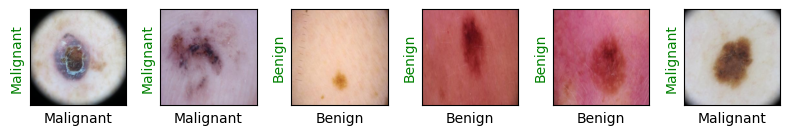

In [11]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

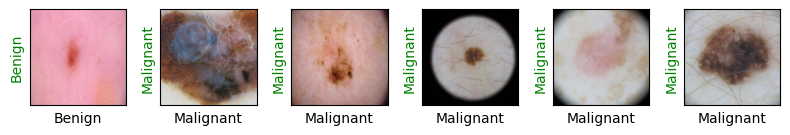

In [12]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

In [13]:
resnet18 = torchvision.models.resnet18(pretrained=True)
print(resnet18)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 98.5MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [14]:
resnet18.fc = torch.nn.Linear(in_features=512, out_features=2)
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)

In [15]:
def show_preds():
    resnet18.eval()
    images, labels = next(iter(dl_test))
    outputs = resnet18(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

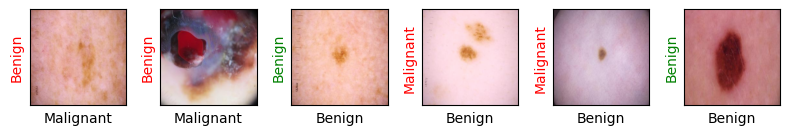

In [16]:
show_preds()

In [21]:
loss_fn = torch.nn.CrossEntropyLoss()

def train(epochs):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0

        resnet18.train()

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)
                acc = 0
                val_loss = 0.
                resnet18.eval()

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    acc += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                acc = acc/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Acc: {acc:.4f}')
                show_preds()

                resnet18.train()

                if acc >= 0.95:
                    print('Performance condition satisfied..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 0.7690, Acc: 0.4580


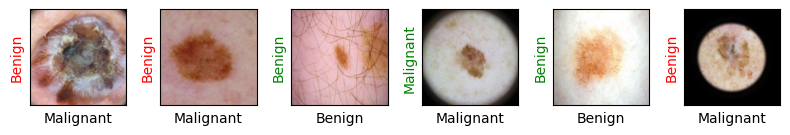

Evaluating at step 20
Validation Loss: 0.3379, Acc: 0.8690


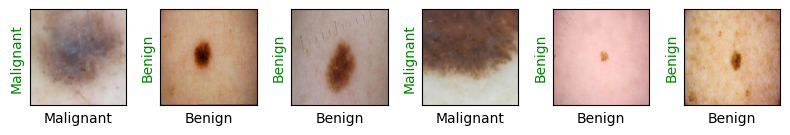

Evaluating at step 40
Validation Loss: 0.2875, Acc: 0.8870


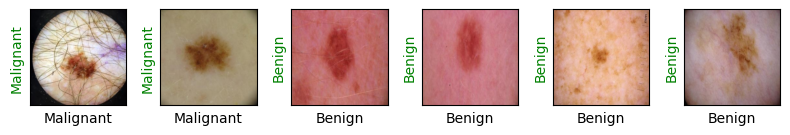

Evaluating at step 60
Validation Loss: 0.2911, Acc: 0.8830


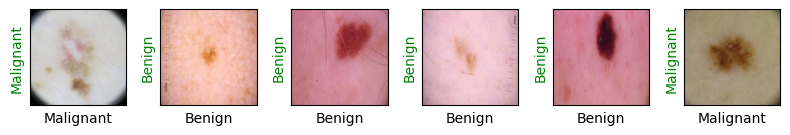

Evaluating at step 80
Validation Loss: 0.2421, Acc: 0.8980


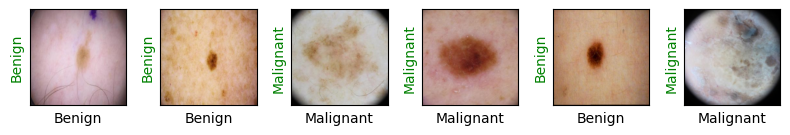

Evaluating at step 100
Validation Loss: 0.2639, Acc: 0.9010


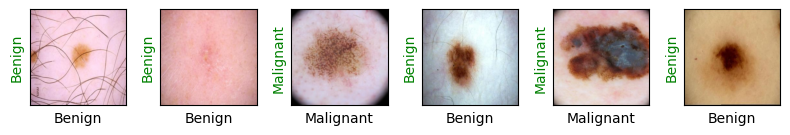

Evaluating at step 120
Validation Loss: 0.2661, Acc: 0.8960


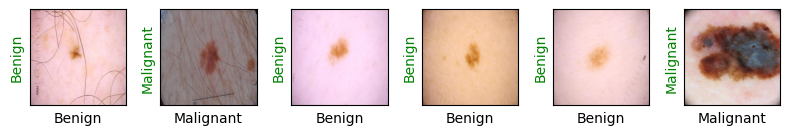

Evaluating at step 140
Validation Loss: 0.2409, Acc: 0.9000


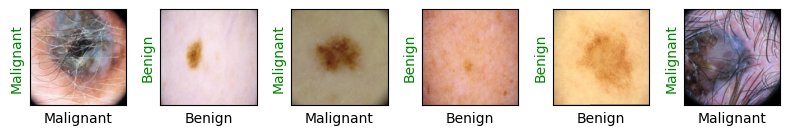

Evaluating at step 160
Validation Loss: 0.2376, Acc: 0.9060


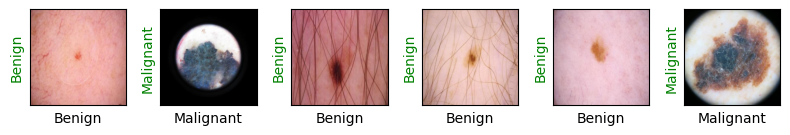

Evaluating at step 180
Validation Loss: 0.2754, Acc: 0.8970


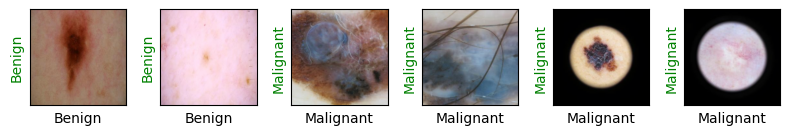

Evaluating at step 200
Validation Loss: 0.2557, Acc: 0.9000


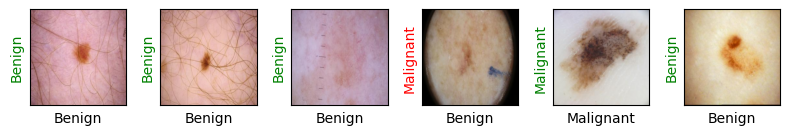

Evaluating at step 220
Validation Loss: 0.2276, Acc: 0.9090


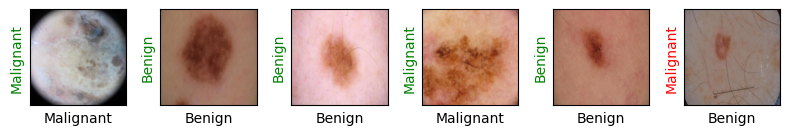

Evaluating at step 240
Validation Loss: 0.2810, Acc: 0.8930


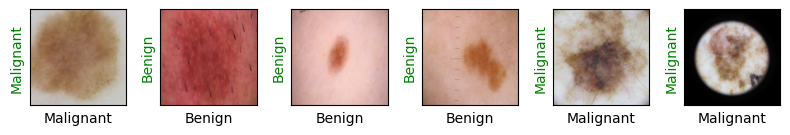

Evaluating at step 260
Validation Loss: 0.2379, Acc: 0.9040


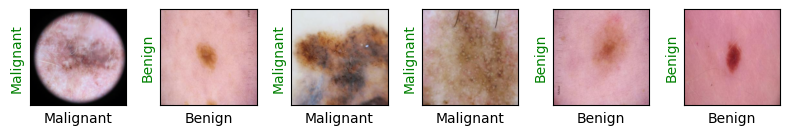

Evaluating at step 280
Validation Loss: 0.2352, Acc: 0.9080


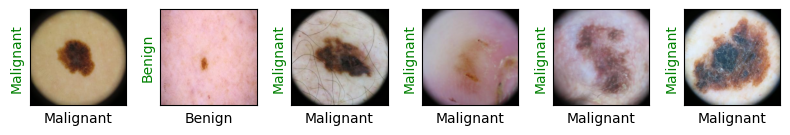

Evaluating at step 300
Validation Loss: 0.2467, Acc: 0.9080


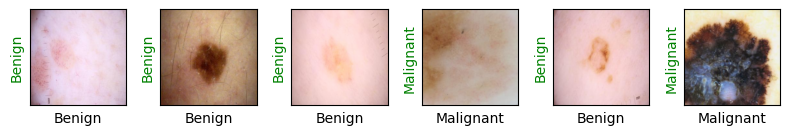

Evaluating at step 320
Validation Loss: 0.2488, Acc: 0.8940


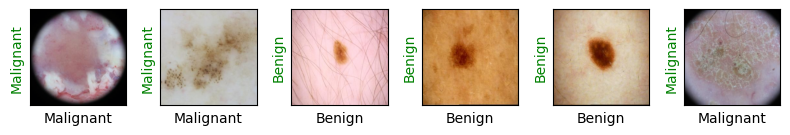

Evaluating at step 340
Validation Loss: 0.2396, Acc: 0.9040


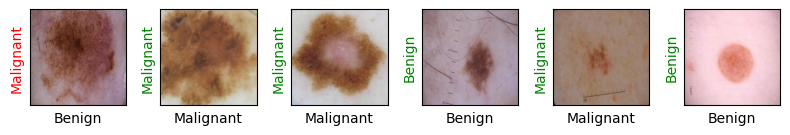

Evaluating at step 360
Validation Loss: 0.2250, Acc: 0.9040


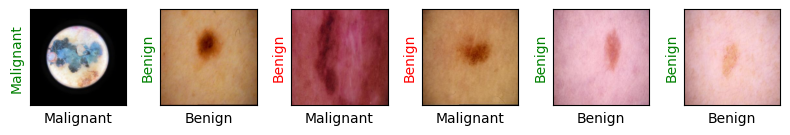

Evaluating at step 380
Validation Loss: 0.2702, Acc: 0.9010


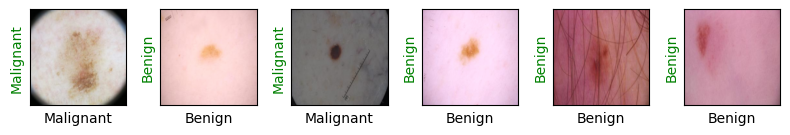

Evaluating at step 400
Validation Loss: 0.2239, Acc: 0.9020


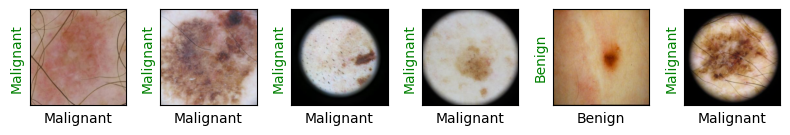

Evaluating at step 420
Validation Loss: 0.2463, Acc: 0.9070


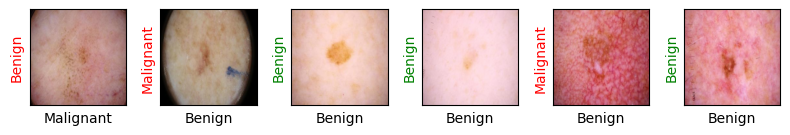

Evaluating at step 440
Validation Loss: 0.2413, Acc: 0.9030


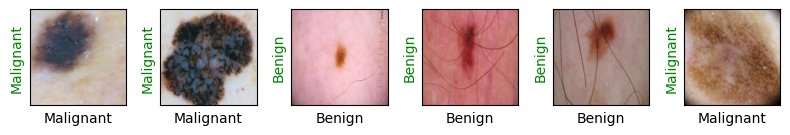

Evaluating at step 460
Validation Loss: 0.2378, Acc: 0.8980


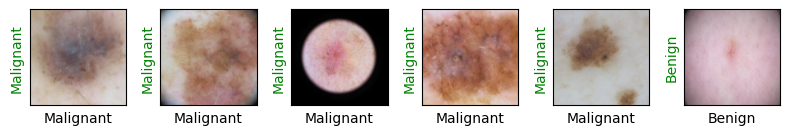

Evaluating at step 480
Validation Loss: 0.2378, Acc: 0.9070


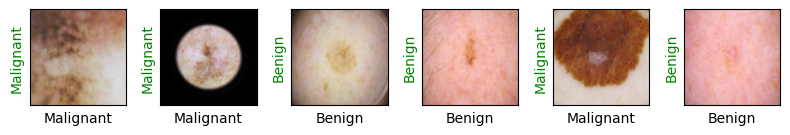

Evaluating at step 500
Validation Loss: 0.2308, Acc: 0.9060


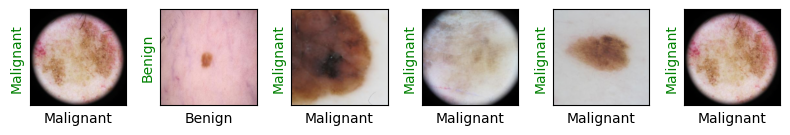

Evaluating at step 520
Validation Loss: 0.2772, Acc: 0.8930


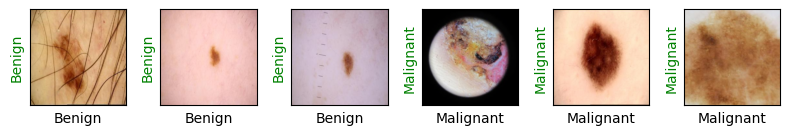

Evaluating at step 540
Validation Loss: 0.2561, Acc: 0.8980


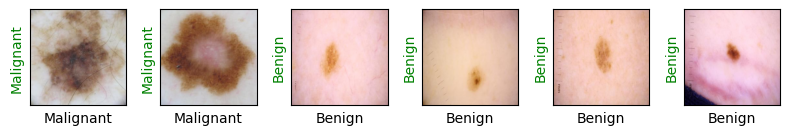

Evaluating at step 560
Validation Loss: 0.2573, Acc: 0.9090


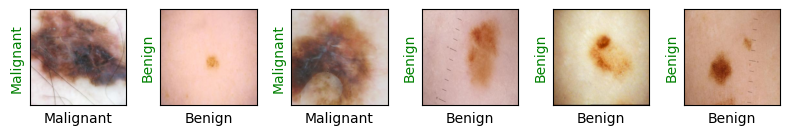

Evaluating at step 580
Validation Loss: 0.2365, Acc: 0.9040


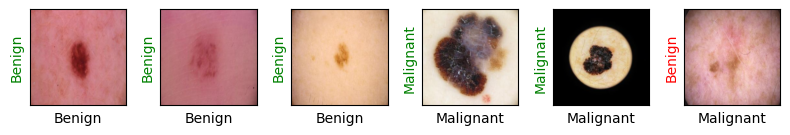

Evaluating at step 600
Validation Loss: 0.2294, Acc: 0.9000


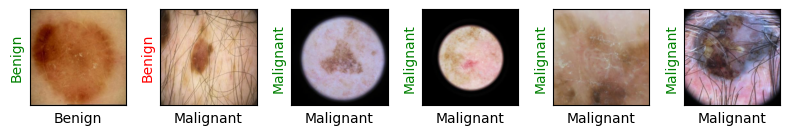

Evaluating at step 620
Validation Loss: 0.2209, Acc: 0.9080


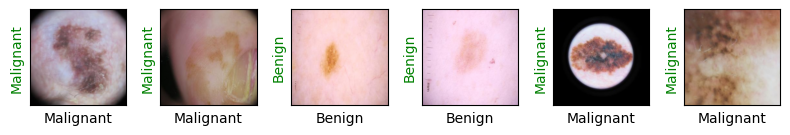

Evaluating at step 640
Validation Loss: 0.2585, Acc: 0.9010


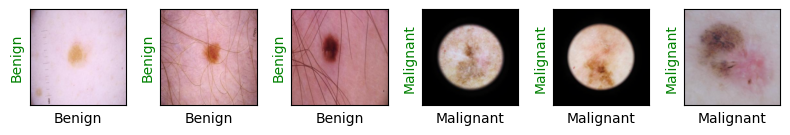

Evaluating at step 660
Validation Loss: 0.2180, Acc: 0.9140


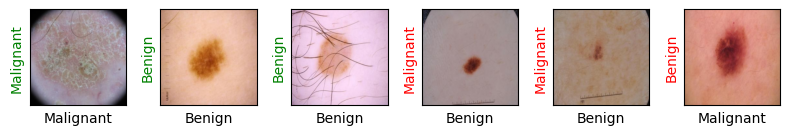

Evaluating at step 680
Validation Loss: 0.2538, Acc: 0.8990


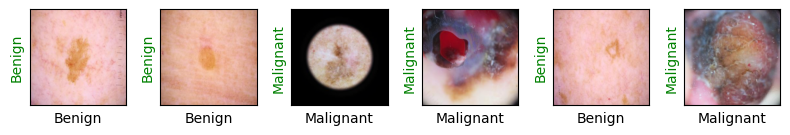

Evaluating at step 700
Validation Loss: 0.2833, Acc: 0.9020


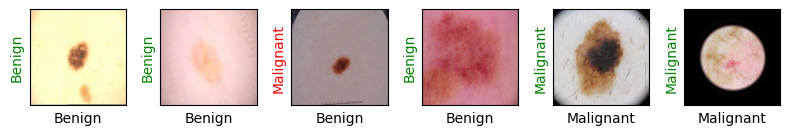

Evaluating at step 720
Validation Loss: 0.2846, Acc: 0.9060


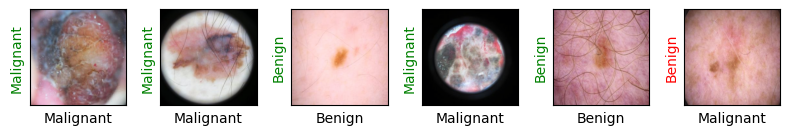

Evaluating at step 740
Validation Loss: 0.2360, Acc: 0.9170


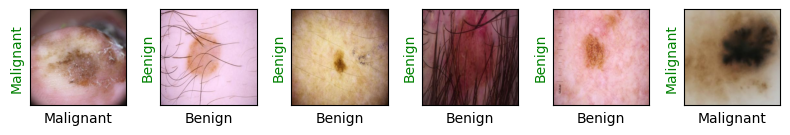

Evaluating at step 760
Validation Loss: 0.2470, Acc: 0.9130


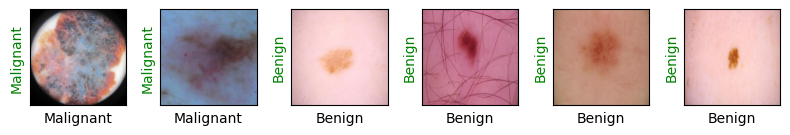

Evaluating at step 780
Validation Loss: 0.3191, Acc: 0.8900


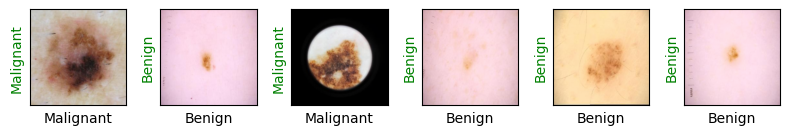

Evaluating at step 800
Validation Loss: 0.2728, Acc: 0.8950


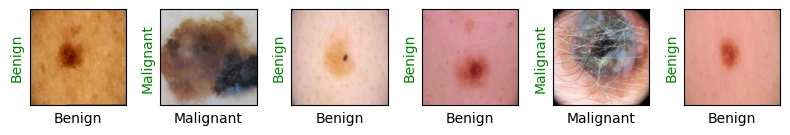

Evaluating at step 820
Validation Loss: 0.2865, Acc: 0.9050


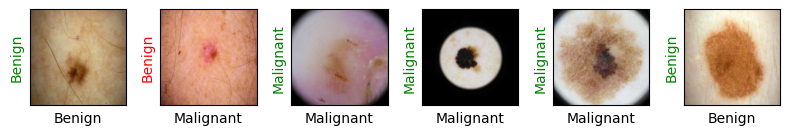

Evaluating at step 840
Validation Loss: 0.2711, Acc: 0.9220


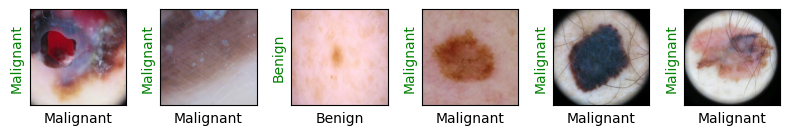

Evaluating at step 860
Validation Loss: 0.2930, Acc: 0.9010


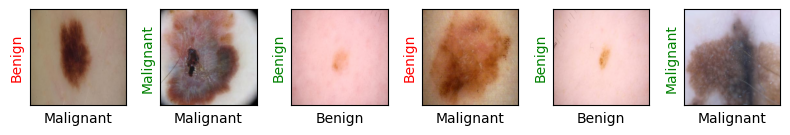

Evaluating at step 880
Validation Loss: 0.2413, Acc: 0.9080


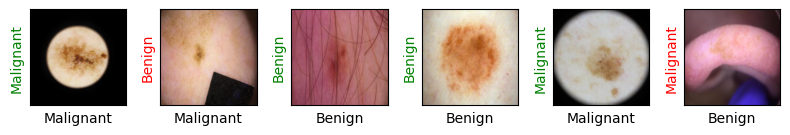

Evaluating at step 900
Validation Loss: 0.2635, Acc: 0.8950


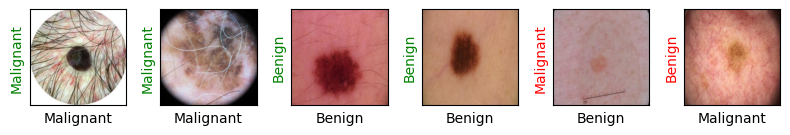

Evaluating at step 920
Validation Loss: 0.2376, Acc: 0.9010


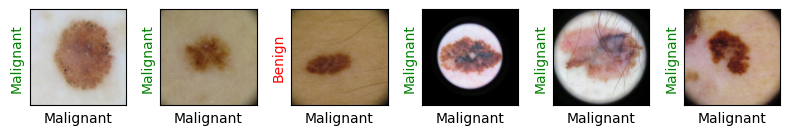

Evaluating at step 940
Validation Loss: 0.2242, Acc: 0.9150


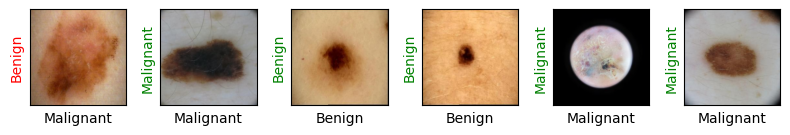

Evaluating at step 960
Validation Loss: 0.2106, Acc: 0.9160


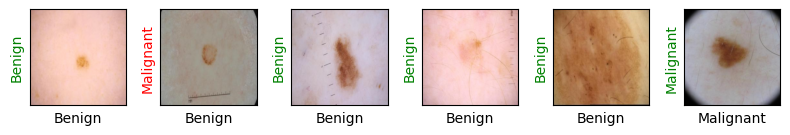

Evaluating at step 980
Validation Loss: 0.2489, Acc: 0.8870


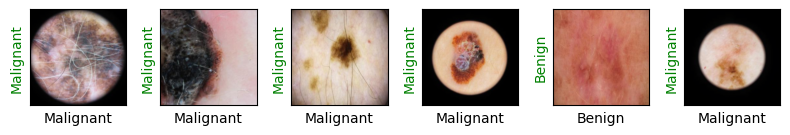

Evaluating at step 1000
Validation Loss: 0.2287, Acc: 0.9210


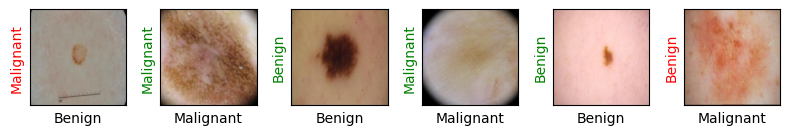

Evaluating at step 1020
Validation Loss: 0.2411, Acc: 0.9120


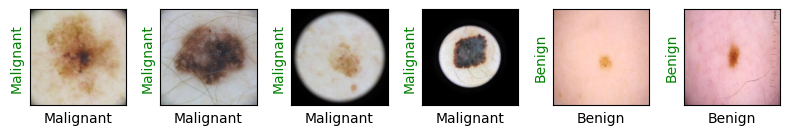

Evaluating at step 1040
Validation Loss: 0.2159, Acc: 0.9110


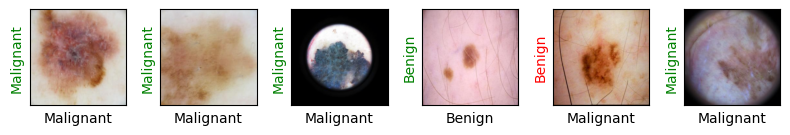

Evaluating at step 1060
Validation Loss: 0.2000, Acc: 0.9200


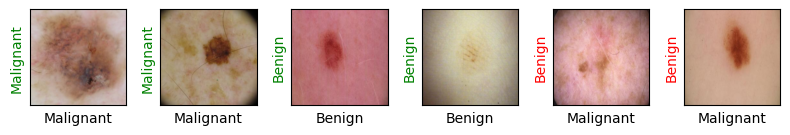

Evaluating at step 1080
Validation Loss: 0.1953, Acc: 0.9170


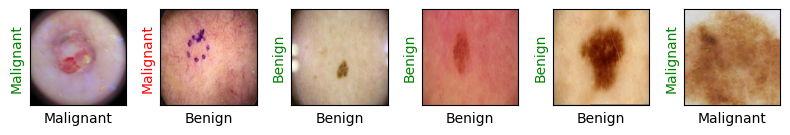

Evaluating at step 1100
Validation Loss: 0.2281, Acc: 0.9150


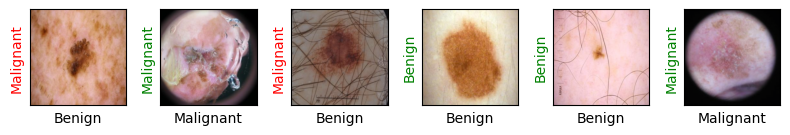

Evaluating at step 1120
Validation Loss: 0.2206, Acc: 0.9070


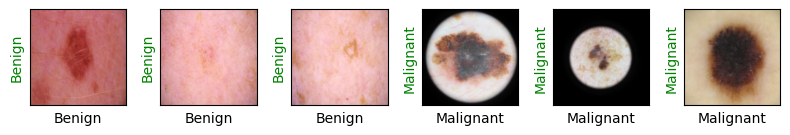

Evaluating at step 1140
Validation Loss: 0.2522, Acc: 0.9160


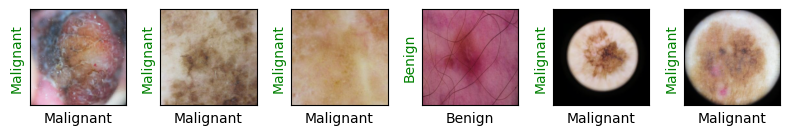

Evaluating at step 1160
Validation Loss: 0.2241, Acc: 0.9280


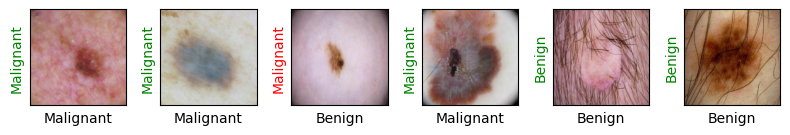

Evaluating at step 1180
Validation Loss: 0.2642, Acc: 0.9130


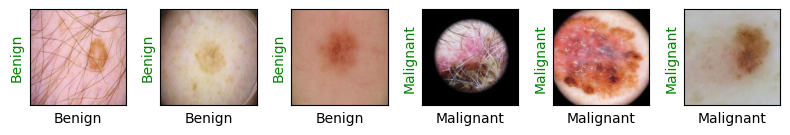

Evaluating at step 1200
Validation Loss: 0.2361, Acc: 0.9150


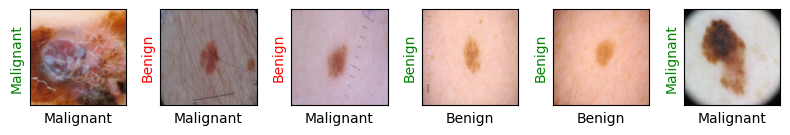

Evaluating at step 1220
Validation Loss: 0.2277, Acc: 0.9190


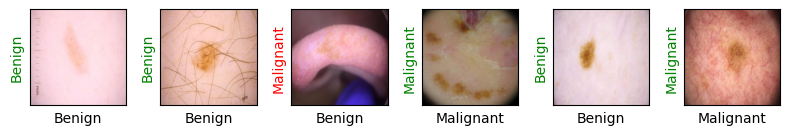

Evaluating at step 1240
Validation Loss: 0.2469, Acc: 0.9060


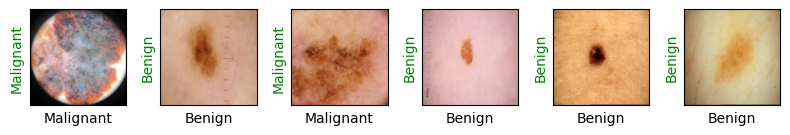

Evaluating at step 1260
Validation Loss: 0.2562, Acc: 0.9120


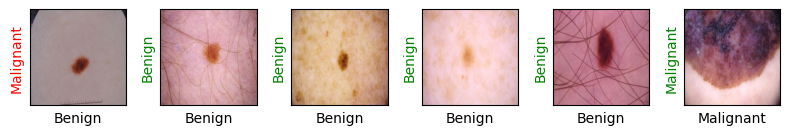

Evaluating at step 1280
Validation Loss: 0.2192, Acc: 0.9130


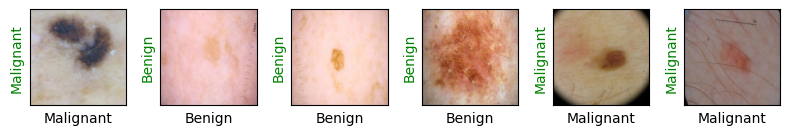

Evaluating at step 1300
Validation Loss: 0.2116, Acc: 0.9120


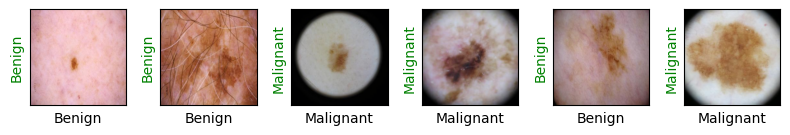

Evaluating at step 1320
Validation Loss: 0.2197, Acc: 0.9100


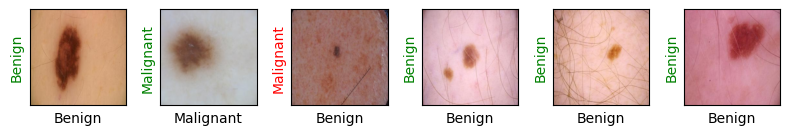

Evaluating at step 1340
Validation Loss: 0.2202, Acc: 0.9240


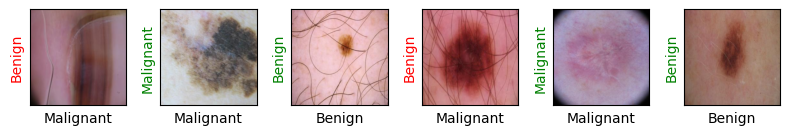

Evaluating at step 1360
Validation Loss: 0.2110, Acc: 0.9220


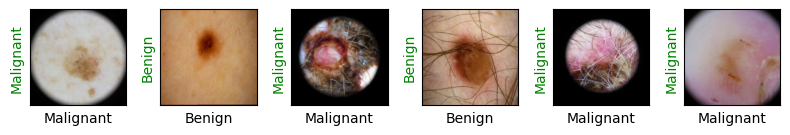

Evaluating at step 1380
Validation Loss: 0.2135, Acc: 0.9180


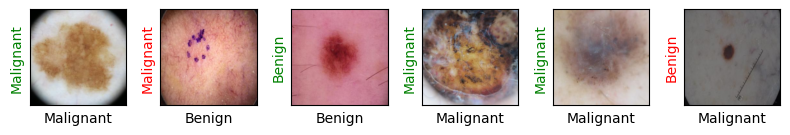

Evaluating at step 1400
Validation Loss: 0.1980, Acc: 0.9240


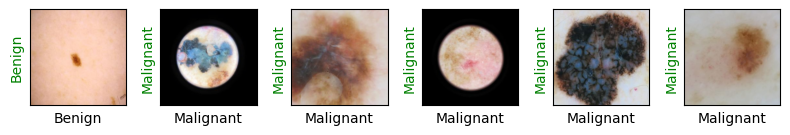

Evaluating at step 1420
Validation Loss: 0.2359, Acc: 0.9070


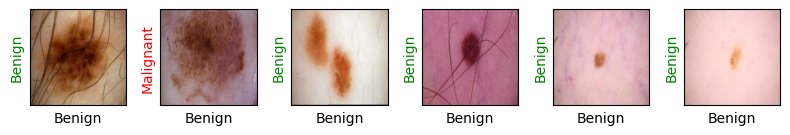

Evaluating at step 1440
Validation Loss: 0.1927, Acc: 0.9250


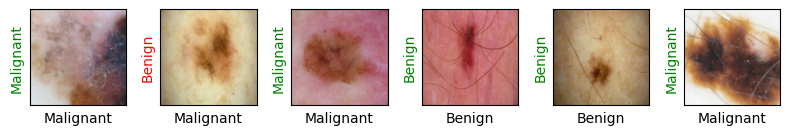

Evaluating at step 1460
Validation Loss: 0.2276, Acc: 0.9240


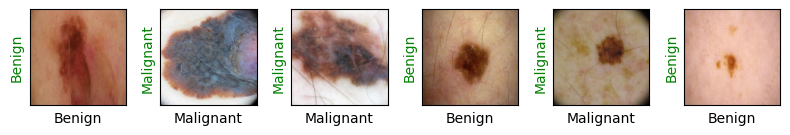

Evaluating at step 1480
Validation Loss: 0.2069, Acc: 0.9300


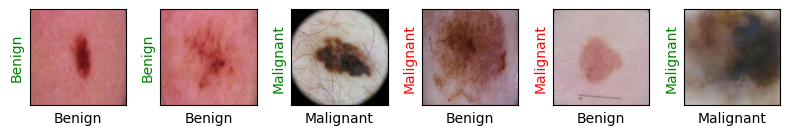

Evaluating at step 1500
Validation Loss: 0.2322, Acc: 0.9060


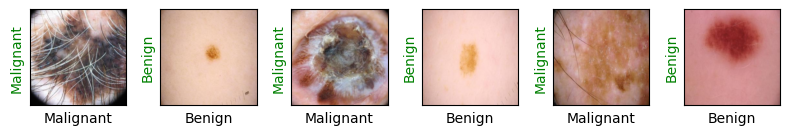

Evaluating at step 1520
Validation Loss: 0.2524, Acc: 0.8980


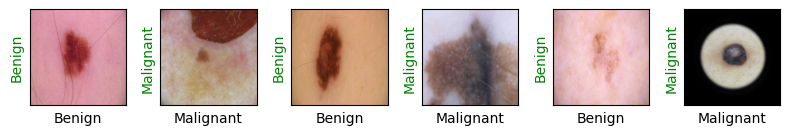

Evaluating at step 1540
Validation Loss: 0.2347, Acc: 0.9110


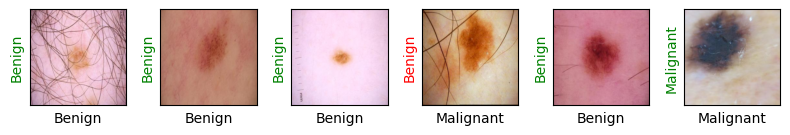

Evaluating at step 1560
Validation Loss: 0.2485, Acc: 0.9160


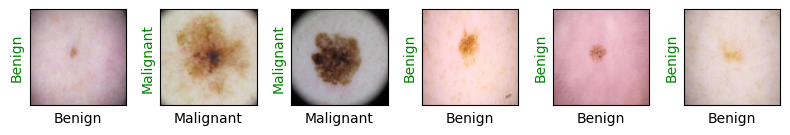

Evaluating at step 1580
Validation Loss: 0.2266, Acc: 0.9190


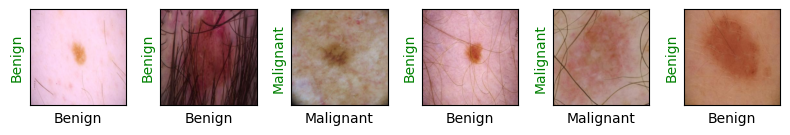

Evaluating at step 1600
Validation Loss: 0.2202, Acc: 0.9170


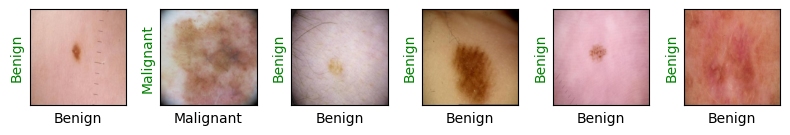

Training Loss: 0.2872
Training complete..


In [22]:
train(epochs=1)

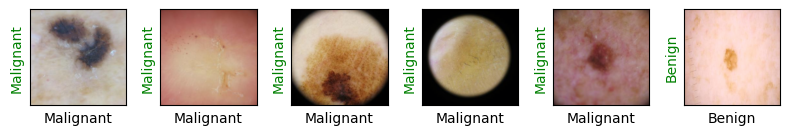

In [23]:
show_preds()

Save the model for future use or deployment

In [32]:
torch.save(resnet18.state_dict(), 'melanoma_classification_model.pth')